In [ ]:
!pip install -q segmentation-models-pytorch
!pip install -q torchsummary

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 71.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 69.3 MB/s eta 0:00:00


In [ ]:
import torch
# Load the model onto the CPU
model = torch.load('/content/Unet-Mobilenet.pt', map_location=torch.device('cpu'))
model.eval()  # If you're loading a trained model for inference


Unet(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1

In [ ]:
from PIL import Image, ImageFile

# Increase the maximum number of pixels allowed to handle large images
Image.MAX_IMAGE_PIXELS = None  # Disable the limit entirely
ImageFile.LOAD_TRUNCATED_IMAGES = True  # Handle truncated images

try:
    # Load your image
    image_path = '/content/drive/MyDrive/SA4Sample.png'
    with Image.open(image_path) as img:
        print("Original image size:", img.size)

        # Define the crop area (left, upper, right, lower)
        # Adjust the crop area as needed to fit your specific needs
        crop_area = (0, 0, 4000, 6000)  # This assumes the relevant part starts from the top-left
        cropped_img = img.crop(crop_area)

        # Convert the image to RGB
        rgb_img = cropped_img.convert('RGB')

        # Optionally save or display the cropped image
        rgb_img.save('cropped_image.jpg')
        rgb_img.show()

except Image.DecompressionBombError as e:
    print(f"DecompressionBombError: {e}")

except Exception as e:
    print(f"An error occurred: {e}")


Original image size: (59037, 34979)


In [ ]:
import torch
from PIL import Image
from torchvision import transforms

# Load the model
model_path = '/content/Unet-Mobilenet.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))
model.eval()

# Load and preprocess the image
image_path = 'cropped_image.jpg'
image = Image.open(image_path)

# Assuming the input image needs to be 4000x6000, no resizing necessary
# Normalize and convert to tensor. Adjust mean and std if your model was trained differently.
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

input_tensor = preprocess(image)
input_batch = input={input_tensor.unsqueeze(0)}  # Create a mini-batch as expected by the model



Original shape: (922, 941, 3)
Shape after adding pixels: (922, 1056, 3)


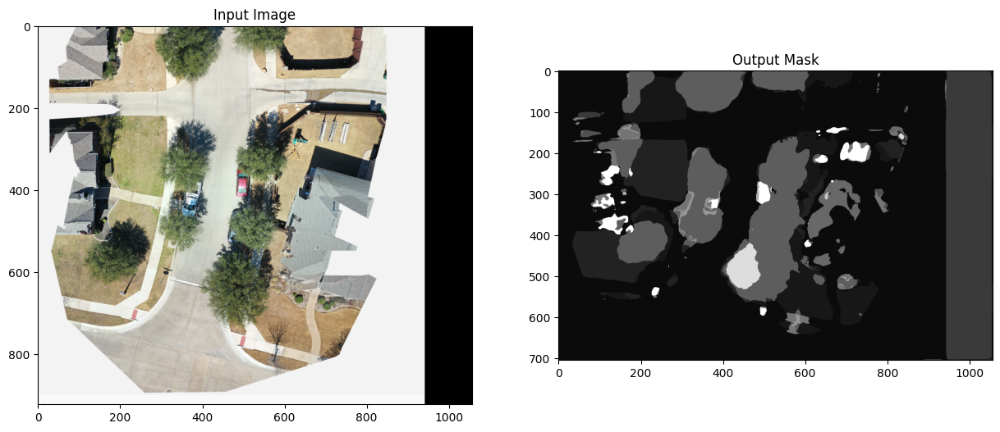

Original shape: (870, 846, 3)
Shape after adding pixels: (870, 1056, 3)


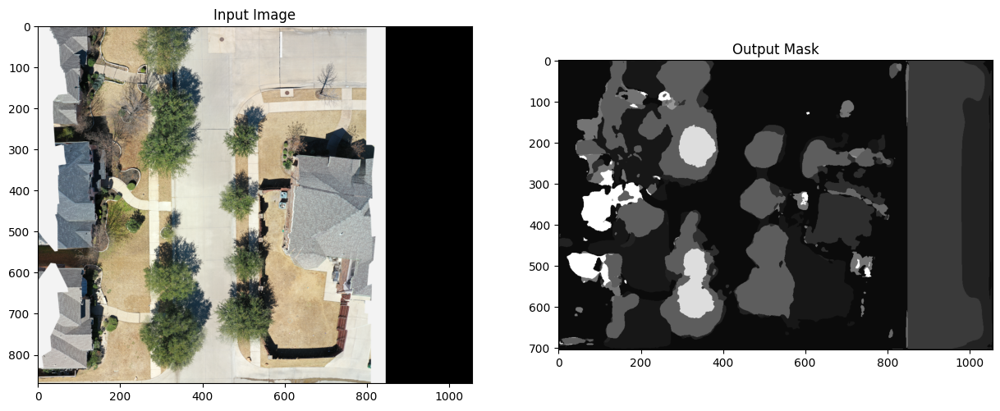

Original shape: (691, 785, 3)
Shape after adding pixels: (704, 1056, 3)


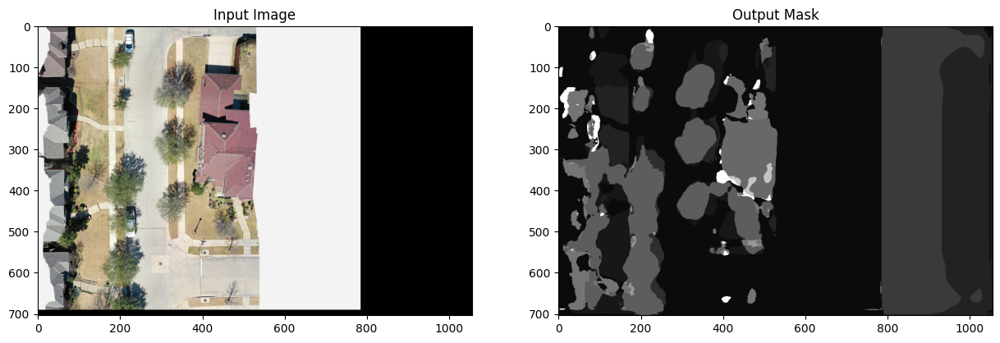

Original shape: (645, 722, 3)
Shape after adding pixels: (704, 1056, 3)


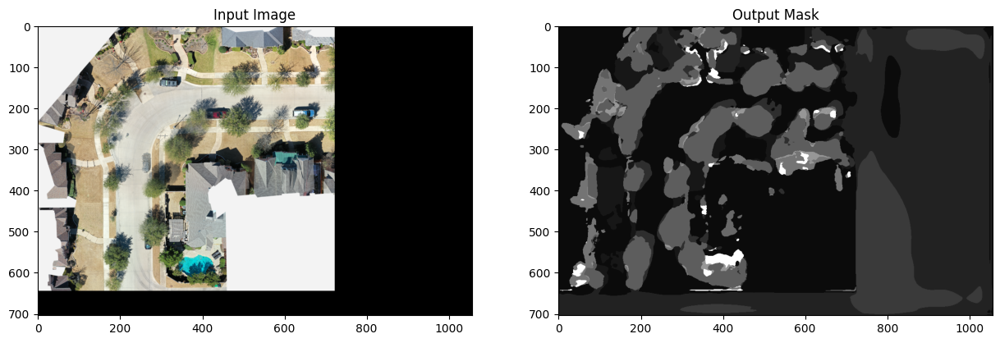

Original shape: (675, 877, 3)
Shape after adding pixels: (704, 1056, 3)


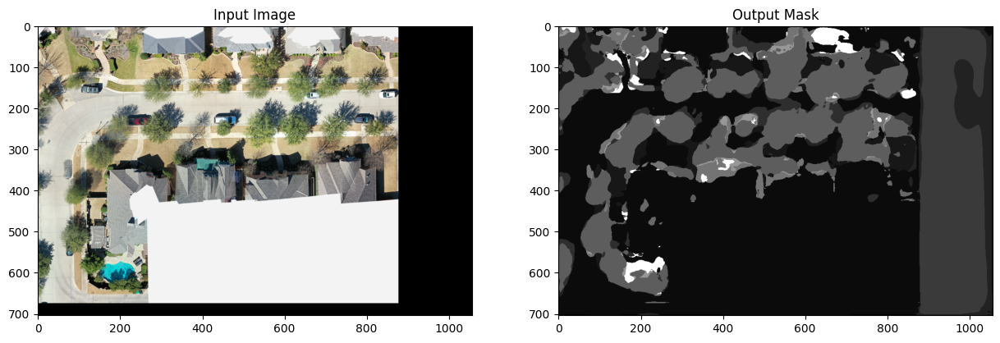

Original shape: (631, 907, 3)
Shape after adding pixels: (704, 1056, 3)


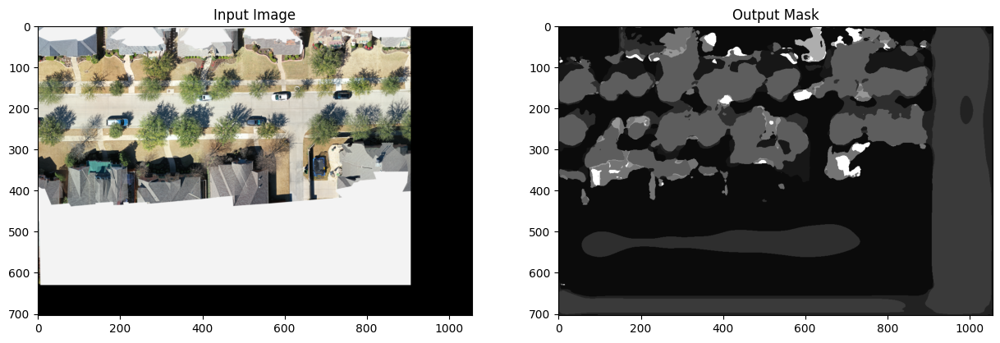

Original shape: (572, 765, 3)
Shape after adding pixels: (704, 1056, 3)


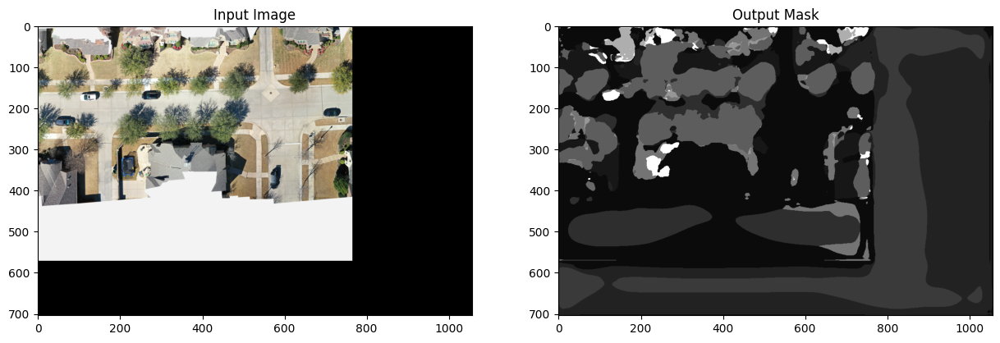

Original shape: (510, 671, 3)
Shape after adding pixels: (704, 1056, 3)


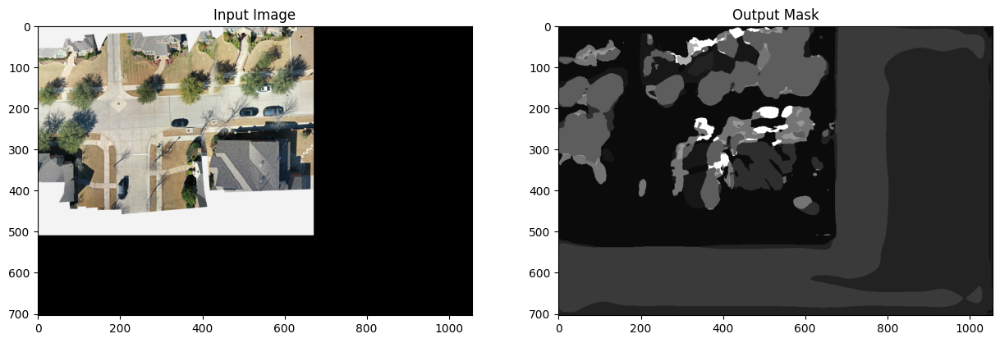

Original shape: (722, 882, 3)
Shape after adding pixels: (722, 1056, 3)


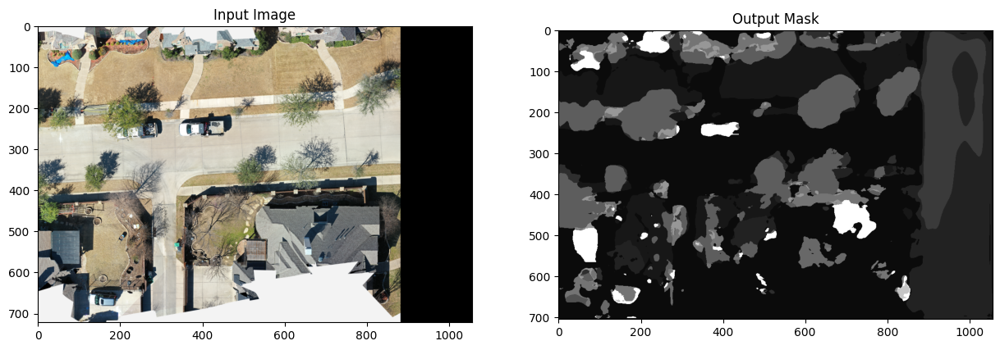

Original shape: (761, 817, 3)
Shape after adding pixels: (761, 1056, 3)


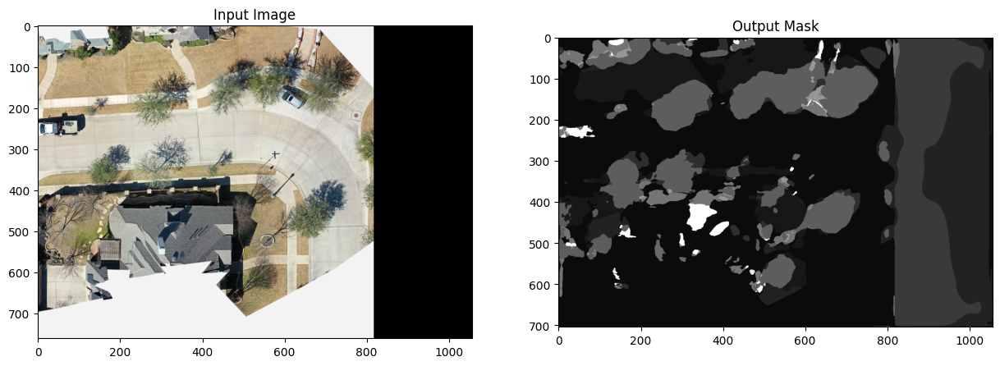

In [ ]:
import torch
import torchvision.transforms as T
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the transformation to apply to the input image
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
transform = T.Compose([
    T.Resize((704, 1056)),
    T.ToTensor(),
    T.Normalize(mean, std)
])

# Load the trained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.load('Unet-Mobilenet.pt', map_location=device)
model = model.to(device)
model.eval()

def process_image(image_path):
    # Load and preprocess the new image
    img = cv2.imread(image_path)

    # Check if the image was loaded correctly
    if img is None:
        raise FileNotFoundError(f"Image file '{image_path}' not found or could not be read.")

    print(f"Original shape: {img.shape}")

    # Add pixels if the image size is too low
    min_size = (704, 1056)
    img = cv2.copyMakeBorder(img, 0, max(0, min_size[0] - img.shape[0]), 0, max(0, min_size[1] - img.shape[1]), cv2.BORDER_CONSTANT, value=[0, 0, 0])

    print(f"Shape after adding pixels: {img.shape}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(img)
    input_image = transform(img)
    input_image = input_image.unsqueeze(0)  # Add batch dimension
    input_image = input_image.to(device)

    # Perform inference
    with torch.no_grad():
        output = model(input_image)

    # Postprocess the output
    output = torch.argmax(output, dim=1)
    output = output.squeeze(0).cpu().numpy()

    # Visualize the input image and the output mask
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    axs[0].imshow(np.array(img))
    axs[0].set_title('Input Image')
    axs[1].imshow(output, cmap='gray')
    axs[1].set_title('Output Mask')
    plt.show()

# Define image paths (modify according to your files)
image_paths = ['/content/a1.png', '/content/a2.png', '/content/a3.png','/content/a4.png','/content/a5.png','/content/a6.png','/content/a7.png','/content/a8.png','/content/a9.png','/content/a10.png']

# Process each image
for path in image_paths:
    process_image(path)


(6000, 4000, 3)


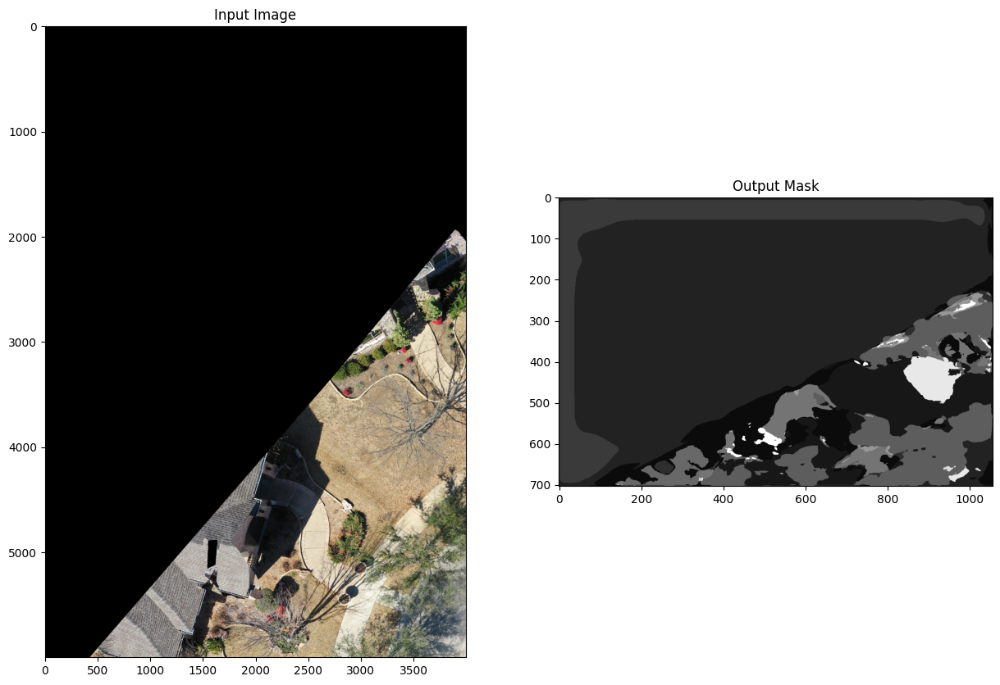

In [ ]:
import torch
import torchvision.transforms as T
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Define the transformation to apply to the input image
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
transform = T.Compose([
    T.Resize((704, 1056)),
    T.ToTensor(),
    T.Normalize(mean, std)
])

# Load the trained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.load('Unet-Mobilenet.pt')
model = model.to(device)
model.eval()

# Load and preprocess the new image
image_path = '/content/cropped_image.jpg'
img = cv2.imread(image_path)
print(img.shape)

# Check if the image was loaded correctly
if img is None:
    raise FileNotFoundError(f"Image file '{image_path}' not found or could not be read.")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = Image.fromarray(img)
input_image = transform(img)
input_image = input_image.unsqueeze(0)  # Add batch dimension
input_image = input_image.to(device)

# Perform inference
with torch.no_grad():
    output = model(input_image)

# Postprocess the output
output = torch.argmax(output, dim=1)
output = output.squeeze(0).cpu().numpy()

# Visualize the input image and the output mask
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(np.array(img))
axs[0].set_title('Input Image')
axs[1].imshow(output, cmap='gray')
axs[1].set_title('Output Mask')
plt.show()


In [ ]:
from PIL import Image, ImageFile
import torch
import torchvision.transforms as T
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Increase the maximum number of pixels allowed to handle large images
Image.MAX_IMAGE_PIXELS = None  # Disable the limit entirely
ImageFile.LOAD_TRUNCATED_IMAGES = True  # Handle truncated images

# Load the trained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.load('Unet-Mobilenet.pt')
model = model.to(device)
model.eval()

# Define the transformation to apply to the input image
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
transform = T.Compose([
    T.ToTensor(),
    T.Normalize(mean, std)
])

try:
    # Load your image
    image_path = '/content/drive/MyDrive/SA4Sample.png'
    with Image.open(image_path) as img:
        print("Original image size:", img.size)

        # Define the block size (704, 1056 to match model's expected input size)
        block_width = 1056
        block_height = 704
        stride_x = 1056
        stride_y = 704
        width, height = img.size
        blocks = []

        # Divide the image into blocks
        for y in range(0, height, stride_y):
            for x in range(0, width, stride_x):
                crop_area = (x, y, min(x + block_width, width), min(y + block_height, height))
                block = img.crop(crop_area)
                blocks.append((block, (x, y)))

        print(f"Number of blocks: {len(blocks)}")

        # Initialize an empty array for the combined mask
        combined_mask = np.zeros((height, width), dtype=np.uint8)

        for block, (x, y) in blocks:
            block = block.convert('RGB')

            # Handle edge blocks by padding to the required size
            original_size = block.size
            if original_size != (block_width, block_height):
                padded_block = Image.new('RGB', (block_width, block_height))
                padded_block.paste(block, (0, 0))
                block = padded_block

            input_image = transform(block)
            input_image = input_image.unsqueeze(0).to(device)

            with torch.no_grad():
                output = model(input_image)

            output = torch.argmax(output, dim=1)
            output = output.squeeze(0).cpu().numpy()

            # Remove padding if block was padded
            if original_size != (block_width, block_height):
                output = output[:original_size[1], :original_size[0]]

            # Combine the mask correctly handling block size
            combined_mask[y:y + original_size[1], x:x + original_size[0]] = output

        # Visualize the input image and the output mask
        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        axs[0].imshow(np.array(img))
        axs[0].set_title('Input Image')
        axs[1].imshow(combined_mask, cmap='gray')
        axs[1].set_title('Output Mask')
        plt.show()

except Image.DecompressionBombError as e:
    print(f"DecompressionBombError: {e}")

except Exception as e:
    print(f"An error occurred: {e}")


Original image size: (59037, 34979)
Number of blocks: 2800


Original image size: (59037, 34979)
Number of blocks: 868


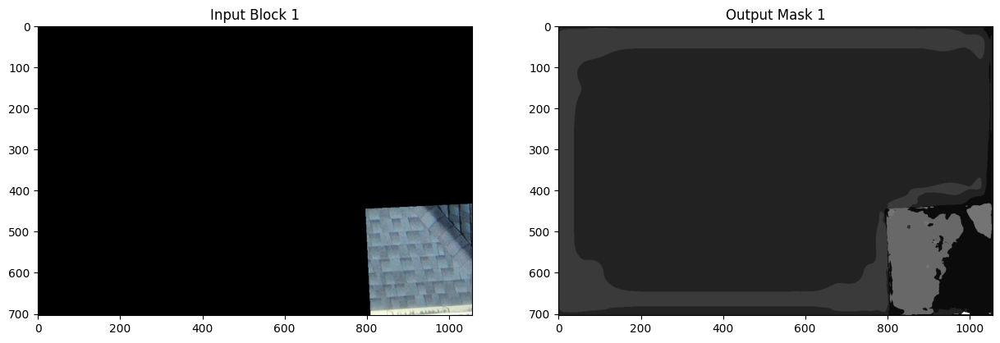

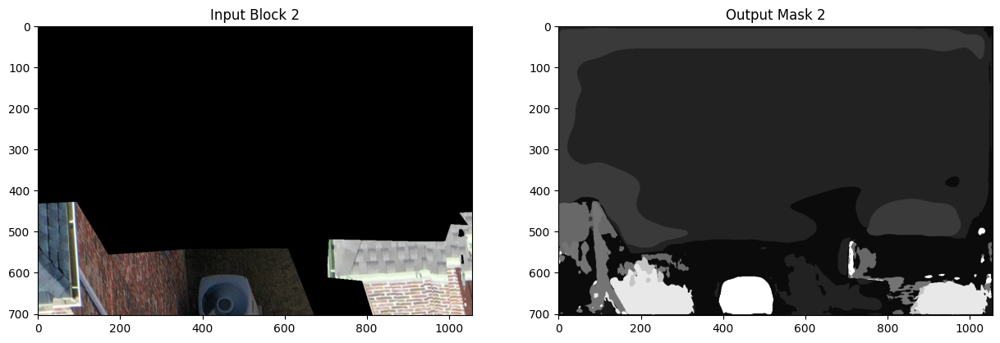

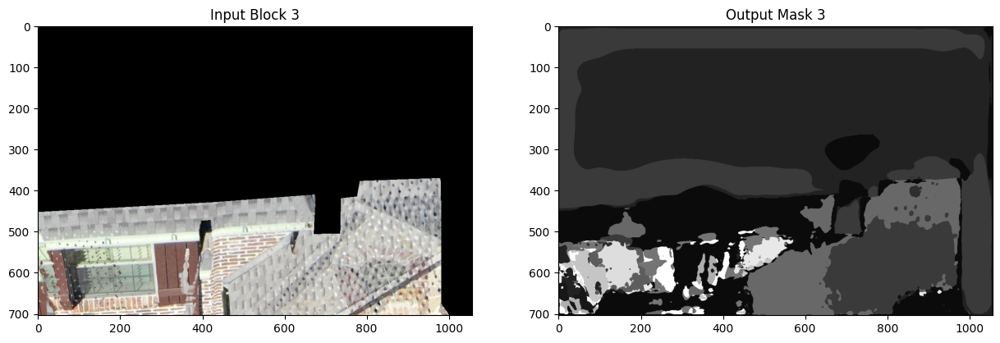

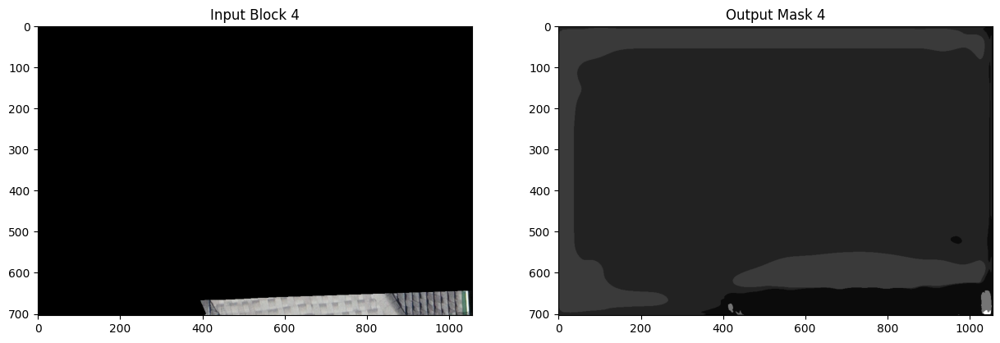

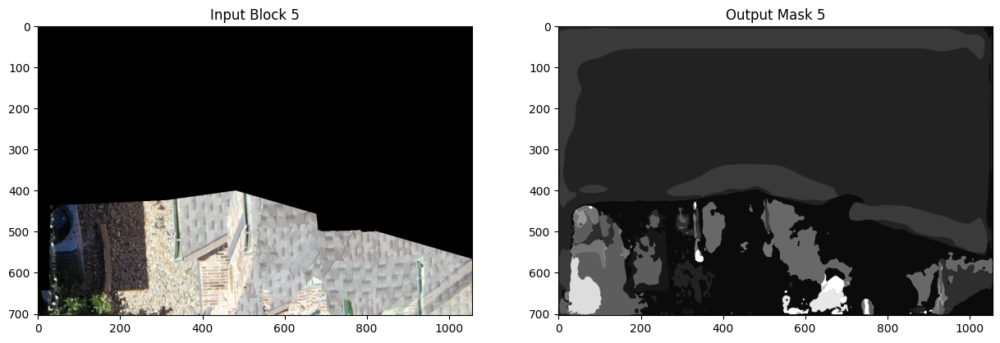

...

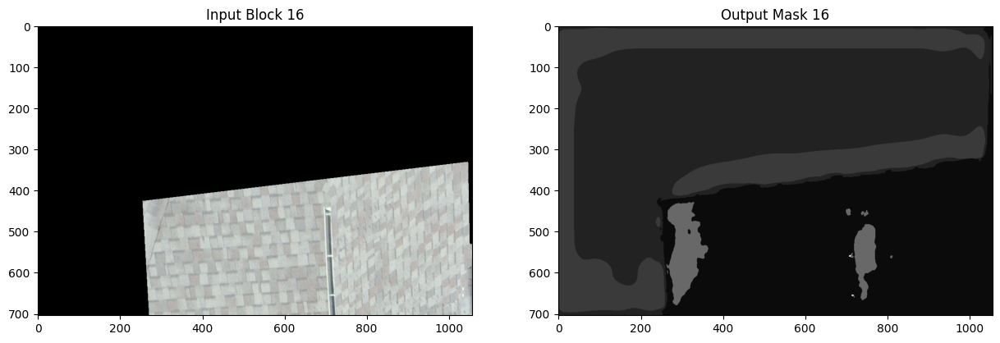

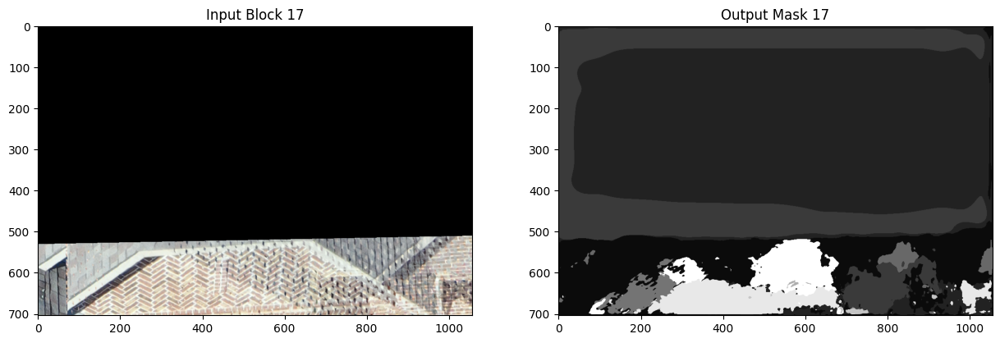

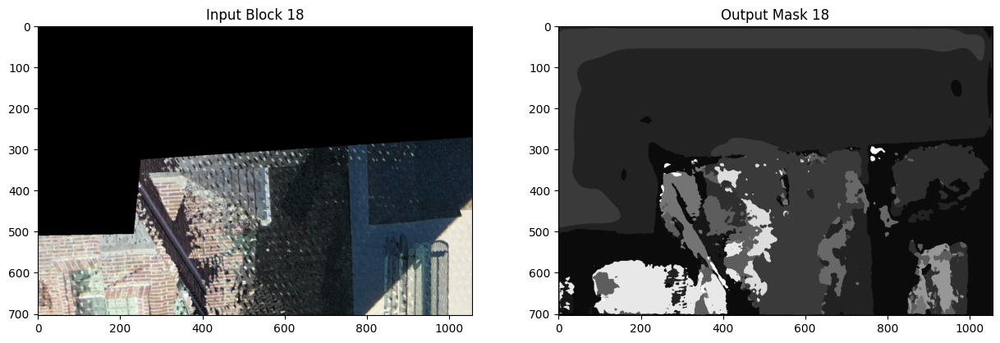

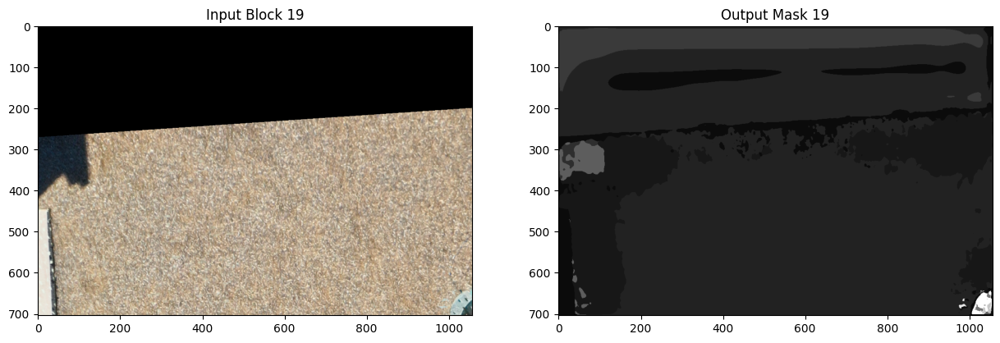

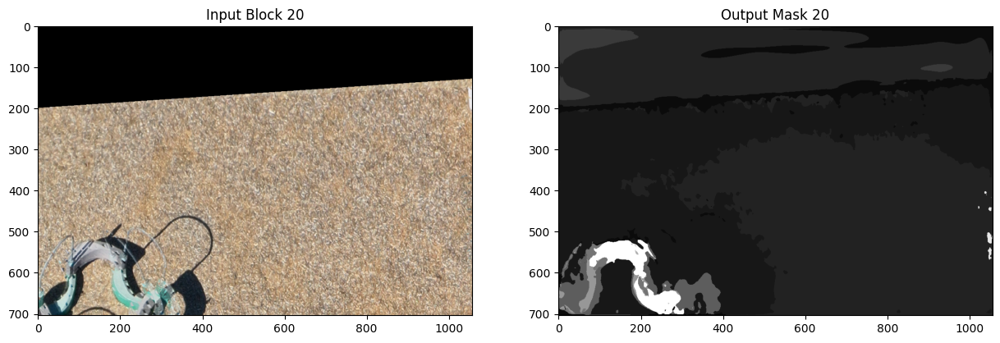

In [ ]:
from PIL import Image, ImageFile
import torch
import torchvision.transforms as T
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Increase the maximum number of pixels allowed to handle large images
Image.MAX_IMAGE_PIXELS = None  # Disable the limit entirely
ImageFile.LOAD_TRUNCATED_IMAGES = True  # Handle truncated images

# Load the trained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.load('Unet-Mobilenet.pt', map_location=device)
model = model.to(device)
model.eval()

# Define the transformation to apply to the input image
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
transform = T.Compose([
    T.Resize((704, 1056)),
    T.ToTensor(),
    T.Normalize(mean, std)
])

def is_uniform(image):
    """Check if the image has uniform pixel values (all pixels are the same)."""
    img_array = np.array(image)
    return np.all(img_array == img_array[0, 0])

try:
    # Load your image
    image_path = '/content/drive/MyDrive/SA4Sample.png'
    with Image.open(image_path) as img:
        print("Original image size:", img.size)

        # Define the block size (704, 1056 to match model's expected input size)
        block_width = 1056
        block_height = 704
        stride_x = 1056
        stride_y = 704
        width, height = img.size
        blocks = []

        # Divide the image into blocks
        for y in range(0, height, stride_y):
            for x in range(0, width, stride_x):
                crop_area = (x, y, min(x + block_width, width), min(y + block_height, height))
                block = img.crop(crop_area)

                # Skip uniform blocks
                if is_uniform(block):
                    continue

                blocks.append((block, (x, y)))

        print(f"Number of blocks: {len(blocks)}")

        # Display the input image and the segmentation map for the first 20 blocks
        for i, (block, (x, y)) in enumerate(blocks[:20]):
            block = block.convert('RGB')

            # Handle edge blocks by padding to the required size
            original_size = block.size
            if original_size != (block_width, block_height):
                padded_block = Image.new('RGB', (block_width, block_height))
                padded_block.paste(block, (0, 0))
                block = padded_block

            input_image = transform(block)
            input_image = input_image.unsqueeze(0).to(device)

            with torch.no_grad():
                output = model(input_image)

            output = torch.argmax(output, dim=1)
            output = output.squeeze(0).cpu().numpy()

            # Remove padding if block was padded
            if original_size != (block_width, block_height):
                output = output[:original_size[1], :original_size[0]]

            # Visualize the input block and the output mask
            fig, axs = plt.subplots(1, 2, figsize=(15, 10))
            axs[0].imshow(np.array(block))
            axs[0].set_title(f'Input Block {i + 1}')
            axs[1].imshow(output, cmap='gray')
            axs[1].set_title(f'Output Mask {i + 1}')
            plt.show()

except Image.DecompressionBombError as e:
    print(f"DecompressionBombError: {e}")

except Exception as e:
    print(f"An error occurred: {e}")


Certainly! Here is an overview of the history of artificial intelligence, including its sub-fields, machine learning, and deep learning, along with an exploration of deep learning and its recent popularity. I'll start with Question 1.1.

### Question 1.1: History of Artificial Intelligence

#### Introduction

Artificial Intelligence (AI) has a rich history that dates back to ancient times, but its formal development as a field of study began in the 20th century. AI encompasses a broad range of techniques and methodologies aimed at creating machines capable of performing tasks that typically require human intelligence. This includes reasoning, learning, perception, problem-solving, and language understanding. AI is divided into various sub-fields, including machine learning and deep learning, each contributing to its evolution and application.

#### Early History and Foundational Concepts

- **Ancient and Medieval Periods**: The concept of artificial beings appears in Greek mythology and medieval stories. Notable examples include the tale of Talos, a giant automaton in Greek mythology, and the mechanical knight designed by Leonardo da Vinci in the 15th century.

- **20th Century Beginnings**:
  - **1950s**: The field of AI was formally founded. Alan Turing, a pioneer in computer science, introduced the concept of a machine that could simulate any human intelligence process, leading to the development of the Turing Test in 1950 to determine if a machine can exhibit intelligent behavior.
  - **1956**: The term "Artificial Intelligence" was coined by John McCarthy at the Dartmouth Conference, marking the birth of AI as a distinct academic discipline. Researchers like Marvin Minsky, Herbert Simon, and Allen Newell contributed foundational theories and models during this period.

#### The Evolution of AI Sub-fields

- **Symbolic AI (1950s-1980s)**:
  - Early AI research focused on symbolic AI, also known as "Good Old-Fashioned AI" (GOFAI), which involved the use of symbols and rules to represent and manipulate knowledge. Programs like the Logic Theorist and General Problem Solver were early successes in this approach.
  - **Expert Systems**: In the 1970s and 1980s, expert systems, which used a set of rules derived from human experts, became popular in fields like medicine and engineering.

- **Machine Learning (1980s-Present)**:
  - **Introduction**: Machine learning emerged as a sub-field of AI focused on developing algorithms that allow computers to learn from and make predictions based on data. Key techniques include supervised learning, unsupervised learning, and reinforcement learning.
  - **Neural Networks**: Inspired by the human brain, neural networks became a key area of research. Despite initial excitement, early neural networks were limited by computational power and algorithmic understanding.
  - **Resurgence**: The 1980s saw a resurgence in neural network research, particularly with the development of backpropagation, an algorithm for training multilayer neural networks.

#### Deep Learning and Modern AI (2000s-Present)

- **Deep Learning**:
  - **Definition**: Deep learning is a subset of machine learning involving neural networks with many layers (hence "deep" networks). It has revolutionized AI by achieving breakthroughs in image and speech recognition, natural language processing, and more.
  - **Advancements**: Advances in computational power (GPUs), availability of large datasets, and novel algorithms (e.g., convolutional neural networks, recurrent neural networks) have propelled deep learning to the forefront of AI research.
  - **Applications**: Deep learning has been applied in numerous domains, including autonomous vehicles, healthcare, finance, and entertainment, demonstrating superhuman performance in some tasks.

#### AI in the 21st Century

- **Integration and Ubiquity**:
  - AI technologies are now integrated into everyday applications, from personal assistants like Siri and Alexa to recommendation systems used by Netflix and Amazon.
  - **Research and Ethics**: Ongoing research aims to address challenges such as explainability, fairness, and ethics in AI. The AI community is increasingly aware of the societal impacts of AI technologies.

#### Conclusion

The history of AI is marked by cycles of optimism, challenges, and breakthroughs. From its early symbolic roots to the rise of machine learning and deep learning, AI has continually evolved, driven by advancements in theory, technology, and application. Understanding this history is crucial for appreciating the current state of AI and anticipating its future directions.

![AI Evolution](https://example.com/ai-evolution.png) *(Note: Image URL is for illustrative purposes)*

---

### Question 1.2: Overview of Deep Learning

#### Introduction

Deep learning, a subset of machine learning, is a powerful tool within the broader domain of artificial intelligence. It involves training large neural networks with many layers to perform tasks such as image and speech recognition, natural language processing, and more. Deep learning has gained significant attention due to its ability to automatically learn and extract features from raw data, leading to breakthroughs in various fields.

#### Relationship Between AI, Machine Learning, and Deep Learning

- **Artificial Intelligence (AI)**: AI is the overarching field concerned with creating machines capable of intelligent behavior. It includes a variety of approaches and techniques aimed at mimicking cognitive functions such as learning, reasoning, and problem-solving.

- **Machine Learning (ML)**: ML is a sub-field of AI that focuses on developing algorithms that allow computers to learn from data. ML techniques enable systems to improve their performance on a task without being explicitly programmed.

- **Deep Learning (DL)**: DL is a further subset of ML that involves neural networks with many layers (deep networks). These networks can automatically learn hierarchical representations of data, making them particularly effective for tasks such as image classification, language translation, and more.

![AI to DL Relationship](https://example.com/ai-ml-dl.png) *(Note: Image URL is for illustrative purposes)*

#### Core Concepts in Deep Learning

- **Neural Networks**: At the heart of deep learning are neural networks, which are inspired by the structure and function of the human brain. These networks consist of interconnected nodes (neurons) organized into layers. Each layer transforms the input data, gradually extracting higher-level features.

- **Training and Backpropagation**: Training a deep neural network involves adjusting the weights of connections between neurons based on the error of predictions. Backpropagation is a key algorithm used to calculate gradients and update weights to minimize the error.

- **Architectures**:
  - **Convolutional Neural Networks (CNNs)**: Designed for processing grid-like data such as images, CNNs use convolutional layers to automatically learn spatial hierarchies of features.
  - **Recurrent Neural Networks (RNNs)**: Suitable for sequential data, RNNs use loops within the network to maintain a memory of previous inputs, making them effective for tasks like language modeling and time-series prediction.
  - **Generative Adversarial Networks (GANs)**: Comprising two networks (a generator and a discriminator) that compete against each other, GANs are used for generating realistic data samples, such as images or text.

#### Impact and Applications of Deep Learning

- **Image and Video Processing**: Deep learning models, particularly CNNs, have revolutionized image recognition, object detection, and video analysis, leading to advancements in fields like healthcare (medical imaging), autonomous driving, and security.

- **Natural Language Processing (NLP)**: Deep learning has enabled significant progress in NLP, with models like transformers and BERT achieving state-of-the-art results in tasks such as language translation, sentiment analysis, and question-answering.

- **Speech Recognition**: Deep learning techniques are behind the impressive performance of modern speech recognition systems, powering virtual assistants and automated transcription services.

- **Healthcare**: Deep learning is being used to develop diagnostic tools, predict patient outcomes, and personalize treatment plans based on individual health data.

#### Conclusion

Deep learning represents a significant leap in the field of AI, enabling machines to learn complex patterns and representations from large amounts of data. Its relationship with AI and ML highlights the layered nature of these fields, with each building on the foundations of the other. The applications of deep learning are vast and continue to expand, showcasing its transformative potential across various industries.

![Deep Learning Applications](https://example.com/dl-applications.png) *(Note: Image URL is for illustrative purposes)*

---

### Question 1.3: Why Deep Learning is Very Popular in Recent Years

#### Introduction

Deep learning has garnered immense popularity in recent years due to a combination of technological advancements, availability of data, and its ability to achieve remarkable performance across various domains. This section explores the reasons behind the surge in deep learning's popularity and its transformative impact on technology and society.

#### Technological Advancements

- **Computational Power**:
  - **GPUs and TPUs**: The development of Graphics Processing Units (GPUs) and Tensor Processing Units (TPUs) has provided the necessary computational power to train large neural networks efficiently. These specialized hardware accelerators significantly reduce the time required for training deep learning models.
  - **Distributed Computing**: Advances in distributed computing frameworks, such as TensorFlow and PyTorch, allow researchers to leverage multiple GPUs or TPUs, further accelerating the training process.

- **Algorithmic Innovations**:
  - **Improved Architectures**: Innovations in neural network architectures, such as convolutional networks (CNNs), recurrent networks (RNNs), and transformers, have led to significant improvements in performance across various tasks.
  - **Optimization Techniques**: Enhanced optimization algorithms, such as Adam and RMSprop, have made it easier to train deep networks by effectively handling issues like vanishing gradients.

#### Availability of Data

- **Big Data**:
  - The proliferation of digital devices and the internet has led to an explosion of data in various forms, including text, images, videos, and sensor data. This abundance of data provides the raw material necessary for training deep learning models.


  - **Data Annotation**: Improved tools and platforms for data annotation have made it easier to create large, labeled datasets, which are crucial for supervised learning.

- **Open Datasets and Competitions**:
  - Initiatives like ImageNet, COCO, and Kaggle competitions have provided researchers with access to high-quality datasets and a platform to benchmark their models, fostering a collaborative and competitive research environment.

#### Performance and Capabilities

- **State-of-the-Art Results**:
  - Deep learning models have consistently achieved state-of-the-art results in various tasks, including image recognition, natural language processing, and speech recognition. Their ability to outperform traditional machine learning methods has driven their adoption in both academia and industry.

- **Feature Learning**:
  - One of the key advantages of deep learning is its ability to automatically learn hierarchical features from raw data, eliminating the need for manual feature engineering. This capability simplifies the modeling process and allows for the discovery of complex patterns.

#### Applications and Impact

- **Wide Range of Applications**:
  - Deep learning has found applications in diverse fields such as healthcare (e.g., medical imaging, drug discovery), finance (e.g., fraud detection, algorithmic trading), entertainment (e.g., content recommendation, generative art), and autonomous systems (e.g., self-driving cars, drones).
  - **Personal Assistants**: Virtual assistants like Siri, Alexa, and Google Assistant rely on deep learning for natural language understanding, speech recognition, and personalized responses.

- **Economic and Societal Impact**:
  - The integration of deep learning into various industries has led to increased efficiency, cost savings, and the creation of new business models. It has the potential to address critical societal challenges, such as improving healthcare outcomes, enhancing education, and tackling environmental issues.

#### Conclusion

The popularity of deep learning in recent years can be attributed to a confluence of factors, including advancements in computational power, the availability of large datasets, algorithmic innovations, and its proven ability to achieve state-of-the-art results. As deep learning continues to evolve, its impact on technology and society is expected to grow, driving further research and applications in various domains.

![Deep Learning Popularity](https://example.com/dl-popularity.png) *(Note: Image URL is for illustrative purposes)*

---

These overviews provide a comprehensive look at the history of artificial intelligence, the relationship between AI, machine learning, and deep learning, and the reasons behind the recent surge in deep learning's popularity. Let me know if you need any additional details or further customization.

### Neural Network Design for Pima Diabetes Dataset

The Pima Diabetes dataset is used for binary classification problems. It consists of 768 samples with eight features, and the target variable indicates whether a person has diabetes or not.

#### Original Architecture

**Layers and Neurons:**

1. **Input Layer:**
   - 8 neurons corresponding to the 8 input features (e.g., number of pregnancies, glucose level, blood pressure, skin thickness, insulin, BMI, diabetes pedigree function, age).

2. **Hidden Layer:**
   - 8 neurons using the ReLU activation function. This layer helps the network learn complex representations by introducing non-linearity.

3. **Output Layer:**
   - 2 neurons using the Softmax activation function. This layer outputs probabilities for the 2 classes (diabetic or non-diabetic), ensuring that the sum of the probabilities is 1.

#### Redesigned Architecture

**Layers and Neurons:**

1. **Input Layer:**
   - 8 neurons corresponding to the 8 input features.

2. **Hidden Layer 1:**
   - 8 neurons using the ReLU activation function. This layer helps the network learn complex representations by introducing non-linearity.

3. **Hidden Layer 2:**
   - 8 neurons using the ReLU activation function. This additional layer increases the depth of the network, allowing for more complex feature extraction.

4. **Hidden Layer 3:**
   - 4 neurons using the ReLU activation function. This layer helps reduce the dimensionality and potentially minimizes noise, making the model more robust.

5. **Output Layer:**
   - 2 neurons using the Softmax activation function. This layer outputs probabilities for the 2 classes, ensuring that the sum of the probabilities is 1.

### Neural Network Design for Iris Dataset

The Iris dataset is a classic dataset used for classification problems. It consists of 150 samples from three species of iris flowers (Iris setosa, Iris versicolor, and Iris virginica). Each sample has four features: sepal length, sepal width, petal length, and petal width.

#### Original Architecture

**Layers and Neurons:**

1. **Input Layer:**
   - 4 neurons corresponding to the 4 input features (sepal length, sepal width, petal length, petal width).

2. **Hidden Layer:**
   - 8 neurons using the ReLU activation function. This layer helps the network learn complex representations by introducing non-linearity.

3. **Output Layer:**
   - 3 neurons using the Softmax activation function. This layer outputs probabilities for the 3 classes (Iris setosa, Iris versicolor, and Iris virginica), ensuring that the sum of the probabilities is 1.

### Comparison of Architectures

The neural network architectures for both the Pima Diabetes and Iris datasets share a similar design philosophy but are tailored to their specific datasets:

1. **Input Layer**:
   - The number of neurons corresponds to the number of features in the dataset.

2. **Hidden Layers**:
   - Both architectures use the ReLU activation function in hidden layers to introduce non-linearity, aiding in learning complex patterns.
   - The Pima Diabetes network includes additional hidden layers (three in the redesigned version) to capture more intricate patterns due to its higher complexity and potential class overlap.

3. **Output Layer**:
   - The Iris dataset's output layer has three neurons to handle multi-class classification, while the Pima Diabetes dataset's output layer has two neurons for binary classification, both using the Softmax activation function to provide probability distributions over classes.

By understanding the dataset characteristics and tailoring the neural network architectures accordingly, we aim to improve model performance and generalization capability.